# Sistemas Inteligentes

## Exercício Computacional 5 - Otimização

Commands

#Creating conda enviroment  
conda create --name grain-training python=3.7
conda activate grain-training

#Installing packages  
pip install opencv-python-headless Pillow jupyter matplotlib deap sklearn

#Add these arguments to pip install in case of problems  
 --trusted-host pypi.python.org --trusted-host files.pythonhosted.org --trusted-host pypi.org

#Generating requirements  
pip freeze > requirements.txt

In [1]:
# Instalação do Deap e importação das bibliotecas
#!pip install deap

import array
from numpy import random
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from deap import base, creator, tools, algorithms

# Importações do grãos
import cv2
import sys
sys.path.append("../")
from segmentation import processing_memory_fix

import math
import time
from datetime import datetime

# Parâmetro Número de coeficientes no Polinômio
IND_SIZE = 5

Resultado = 230 grãos contados


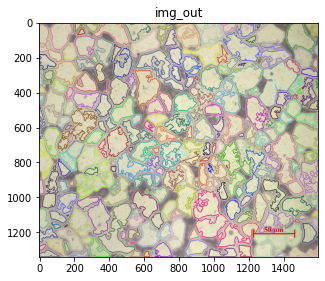

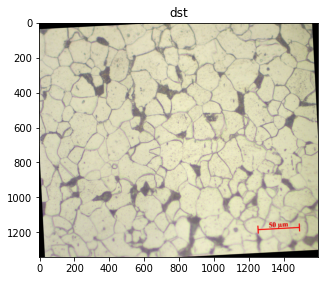

In [20]:
# Testando importações do grãos
img = cv2.imread("../data/Aco224.jpg")
s = [1, 191, 3, 5, 0, 2, 0, 41]
img_out, resultado = processing_memory_fix(img, s)
print("Resultado = {} grãos contados".format(resultado))
plt.figure(figsize=(5,5)); plt.title("img_out"); fig = plt.imshow(cv2.cvtColor(img_out.copy(),cv2.COLOR_BGR2RGB), 'gray')

# Testando rotação
rows,cols,_ = img_out.shape
M = cv2.getRotationMatrix2D((cols/2,rows/2),3,1)
img = cv2.warpAffine(img,M,(cols,rows))

plt.figure(figsize=(5,5)); plt.title("dst"); fig = plt.imshow(cv2.cvtColor(dst,cv2.COLOR_BGR2RGB), 'gray')

In [3]:
#Construção de uma base de dados primitiva
img1 = plt.imread('../data/Aco224.jpg')
img2 = plt.imread('../data/Alu55.jpg')
img3 = plt.imread('../data/Alu205.jpg')
images = [img1,img2,img3]
counts = [224,55,205]

In [21]:
#Base de dados completa
mapping = {
    'Aco224.jpg' :   224,
    'Aco851.jpg' :   851,
    'Aco50+-.jpeg' :  50,
    'Alu205.jpg' :   205,
    'Alu55.jpg' :     55,
    #'Alu8.jpg' :       8,
    #'Alu50.jpeg' :    50,
    #'Alu69.jpg' :     69,
    #'Aco417.jpg' :   417,
    #'Ferrite891.png' : 891,
}

# List all files in a directory using os.listdir
def isimageformat(file_str):
    exts = [".png",".jpg",".jpeg",".tif",".tiff",".bmp"]
    for ext in exts:
        if file_str.lower().endswith(ext):
            return ext[1:]
    return False

def makeDataset(basepath="./", images=[], counts=[]):
    for file in os.listdir(basepath):
        filepath = os.path.join(basepath, file)
        if os.path.isfile(filepath) and isimageformat(filepath) and (file in mapping.keys()):
            print("Image:", file)
            print("Count:", mapping[file])

            # Opening the image
            img = cv2.imread(filepath)
            images.append(img)

            # Reshape
            # shape_old = img.shape[:2]
            # if min(shape_old)<500:
            #     factor = 2
            #     img = cv2.resize(img, None, fx=factor, fy=factor, interpolation=cv2.INTER_LINEAR)
            #     print("Reshape:", shape_old, "->", img.shape[:2])
            # elif min(shape_old)<600:
            #     factor = 1.5
            #     img = cv2.resize(img, None, fx=factor, fy=factor, interpolation=cv2.INTER_LINEAR)
            #     print("Reshape:", shape_old, "->", img.shape[:2])

            # Reshape Augmentation
            factor = 1.1
            images.append(cv2.resize(img, None, fx=factor, fy=factor, interpolation=cv2.INTER_LINEAR))

            # Rotation Augmentation
            rows,cols,_ = img.shape
            M = cv2.getRotationMatrix2D((cols/2,rows/2),2,1)
            images.append(cv2.warpAffine(img,M,(cols,rows)))

            M = cv2.getRotationMatrix2D((cols/2,rows/2),-3,1)
            images.append(cv2.warpAffine(img,M,(cols,rows)))
            
            # images.append(cv2.flip(img, 1))
            # counts.append(mapping[file])

            # images.append(cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE))
            # counts.append(mapping[file])

            for _ in range(4): counts.append(mapping[file])

    return images, counts

# Applying function
basepath = '../data/'
images, counts = makeDataset(basepath)

Image: Aco224.jpg
Count: 224
Image: Aco851.jpg
Count: 851
Image: Alu205.jpg
Count: 205
Image: Alu55.jpg
Count: 55


In [22]:
#Função utilidade que testa se um estado está dentro das restrições de cada variável
def checkRange(sol):
    if not  0 <= sol[0] <=  1: return False
    if not(99 <= sol[1] <= 299 and sol[1]%2!=0): return False
    if not  0 <= sol[2] <= 20: return False
    if not( 3 <= sol[3] <=  7 and sol[3]%2!=0): return False
    if not  0 <= sol[4] <=  2: return False
    if not  0 <= sol[5] <=  5: return False
    if not  0 <= sol[6] <=  2: return False
    if not 15 <= sol[7] <= 50: return False
    return True

# Função de conversão
def rangeConversion(ovalue, omin, omax, nmin, nmax):
    orange = (omax - omin)  
    nrange = (nmax - nmin)
    nvalue = (((ovalue - omin) * nrange) / orange) + nmin
    return nvalue

def round_to_odd(number):
    if round(number) % 2 == 1:
        return round(number)
    if math.ceil(number-1) % 2 == 1:
        return math.ceil(number-1)
    else:
        return math.floor(number+1)

omin = 0
omax = 29
def indConversion(ind):
    out = [
               round(rangeConversion(ind[0], omin, omax,   0,   1)),
        round_to_odd(rangeConversion(ind[1], omin, omax,  99, 299)),
               round(rangeConversion(ind[2], omin, omax,   0,  20)),
        round_to_odd(rangeConversion(ind[3], omin, omax,   3,   7)),
               round(rangeConversion(ind[4], omin, omax,   0,   2)),
               round(rangeConversion(ind[5], omin, omax,   0,   5)),
               round(rangeConversion(ind[6], omin, omax,   0,   2)),
               round(rangeConversion(ind[7], omin, omax,  15,  50)),
    ]
    return out

### 3.2 Criação de Tipos, Toolbox, Função de Avaliação e Operadores Genéticos

In [23]:
# Definindo tipos GRAIN
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)
creator.create("Strategy", array.array, typecode="d")

# Definindo tipos EC
#creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
#creator.create("Individual", array.array, typecode="d", fitness=creator.FitnessMin, strategy=None)
#creator.create("Strategy", array.array, typecode="d")

# Testando
creator.Individual([0,199,3,3,0,3,0,20])

C:\Users\Bruno-NB\Anaconda3\envs\grain-training\lib\site-packages\deap\creator.py:141: RuntimeWarning: A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  RuntimeWarning)
C:\Users\Bruno-NB\Anaconda3\envs\grain-training\lib\site-packages\deap\creator.py:141: RuntimeWarning: A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  RuntimeWarning)
C:\Users\Bruno-NB\Anaconda3\envs\grain-training\lib\site-packages\deap\creator.py:141: RuntimeWarning: A class named 'Strategy' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  RuntimeWarning)


[0, 199, 3, 3, 0, 3, 0, 20]

In [24]:
# Toolbox
toolbox = base.Toolbox()

# Definindo funções para gerar indivíduos novos GRAIN

def generateES(ind_cls, strg_cls):
    ind = ind_cls(random.randint(omin,omax+1) for _ in range(8))
    ind.strategy = strg_cls(random.normal() for _ in range(8))
    return ind

toolbox.register("individual", generateES, creator.Individual, creator.Strategy)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

# Testando
ind = toolbox.individual()
pop = toolbox.population(n=3)

print("ind is of type %s and contains %d bits\n%s" % (type(ind), len(ind), ind))
print("pop is of type %s and contains %d individuals" % (type(pop), len(pop)))
for indiv in pop: print(indiv)

ind is of type <class 'deap.creator.Individual'> and contains 8 bits
[22, 10, 4, 26, 15, 9, 18, 25]
pop is of type <class 'list'> and contains 3 individuals
[18, 6, 22, 8, 17, 10, 13, 14]
[16, 3, 26, 21, 26, 18, 7, 11]
[0, 27, 24, 26, 18, 11, 6, 3]


In [25]:
# Definindo funções evolucionárias GRAIN

toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", tools.mutUniformInt, low=omin, up=omax, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)

# Testando
ind = toolbox.individual()
print("Indivíduo Inicial:\n", ind)
ind = toolbox.mutate(ind)[0]
print("Indivíduo Mutado:\n", ind)
ind = indConversion(ind)
print("Indivíduo Convertido:\n", ind)
print("Mutação correta?: ", checkRange(ind))

Indivíduo Inicial:
 [1, 15, 12, 20, 3, 24, 26, 27]
Indivíduo Mutado:
 [1, 15, 12, 20, 3, 24, 26, 27]
Indivíduo Convertido:
 [0, 203, 8, 5, 0, 4, 2, 48]
Mutação correta?:  True


In [26]:
# Definindo funções de avaliação GRAIN

def evalGrain(individual, fit='avg_p', show=False):
    ind = indConversion(individual)
    avg = 0.0; avg_p = 0.0; mse = 0.0
    for img, count_real in zip(images,counts):

        img_out, count_pred = processing_memory_fix(img, ind)

        diff = abs(count_real-count_pred)
        e = diff/count_real
        avg += diff
        avg_p += e
        mse += diff**2

        if show: 
            title = "pred:{}, real:{}, diff:{} ,error:{:0.2f}%".format(count_pred, count_real, diff, e*100)
            plt.figure(figsize=(5,5)); plt.title(title); fig = plt.imshow(cv2.cvtColor(img_out,cv2.COLOR_BGR2RGB), 'gray')
    avg = avg/len(images)
    avg_p = avg_p/len(images)
    mse = mse/len(images)

    if   fit=='avg_p': return avg_p,
    elif fit=='avg'  : return avg,
    else:              return mse,

toolbox.register("evaluate", evalGrain)

# Testando
ind = toolbox.individual()
print("Indivíduo Inicial:\n", ind)
print("Indivíduo Convertido:\n", indConversion(ind))
result = toolbox.evaluate(ind)[0]
print("Resultado:\n", result)

Indivíduo Inicial:
 [28, 27, 0, 10, 7, 22, 4, 9]
Indivíduo Convertido:
 [1, 285, 0, 5, 0, 4, 0, 26]
Resultado:
 0.3573293195364544


### 3.3 Evolução

In [27]:
# Definindo função de evolução
def evolution(NIND = 10, NGEN = 3, CXPB = 0.5, MUTPB = 0.2):
    pop = toolbox.population(n=NIND)
    hof = tools.HallOfFame(1)
    stats = tools.Statistics(lambda ind: ind.fitness.values)
    stats.register("avg", np.mean)
    stats.register("std", np.std)
    stats.register("max", np.max)
    stats.register("min", np.min)
    pop, log = algorithms.eaSimple(pop, toolbox, cxpb = CXPB, mutpb=MUTPB, ngen=NGEN, stats=stats, halloffame=hof, verbose=True)

    return pop, log, hof

In [28]:
# Evolução
# Parâmetros
NIND = 50; NGEN = 50
CXPB = 0.5; MUTPB = 0.2

# Chamando evolução
print("current Time", datetime.now().strftime("%H:%M:%S"))
start_time = time.time()
pop, log, hof = evolution(NIND, NGEN, CXPB, MUTPB)

# Resultados
best = hof[0]
fitness = str(hof[0].fitness)[1:8]
runtime = (time.time()-start_time)/60
print("BestInd: {} -> {} ; fitness: {} ; runtime: {:0.2f} min".format(best, indConversion(best), fitness, runtime))

current Time 16:31:51
gen	nevals	avg     	std     	max     	min     
0  	50    	0.640889	0.248537	0.992825	0.142042
1  	26    	0.474557	0.22426 	0.988433	0.189552 [20, 14, 2, 5, 12, 23, 13, 28]
2  	25    	0.336664	0.167522	0.921101	0.138384 [18, 14, 7, 7, 10, 27, 14, 13]
3  	27    	0.261321	0.0943886	0.588298	0.138384 [18, 14, 7, 7, 10, 27, 14, 13]
4  	37    	0.240715	0.105149 	0.563794	0.138384 [18, 14, 7, 7, 10, 27, 14, 13]
5  	35    	0.241407	0.142345 	0.802048	0.138384 [18, 14, 7, 7, 10, 27, 14, 13]
6  	34    	0.214181	0.135277 	0.731532	0.132405 [17, 7, 7, 7, 10, 28, 14, 4]
7  	26    	0.172469	0.0810714	0.63125 	0.124081 [18, 7, 7, 7, 10, 28, 14, 13]
8  	34    	0.184283	0.161751 	0.981183	0.124081 [18, 7, 7, 7, 10, 28, 14, 13]
9  	28    	0.168722	0.134058 	0.833826	0.124081 [18, 7, 7, 7, 10, 28, 14, 13]
10 	32    	0.172008	0.089233 	0.568616	0.124081 [18, 7, 7, 7, 10, 28, 14, 13]
11 	31    	0.175863	0.139961 	0.728625	0.124081 [18, 7, 7, 7, 10, 28, 14, 13]
12 	32    	0.159827	0.12

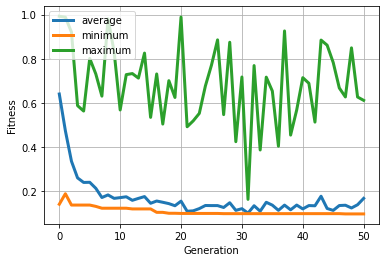

In [29]:
# Gráfico
gen, avg, min_, max_ = log.select("gen", "avg", "min", "max")
plt.plot(gen, avg, label="average", linewidth=3)
plt.plot(gen, min_, label="minimum", linewidth=3)
plt.plot(gen, max_, label="maximum", linewidth=3)
plt.xlabel("Generation")
plt.ylabel("Fitness")
plt.legend(loc="upper left")
plt.grid(True)
plt.show()

(0.09830179895007904,)

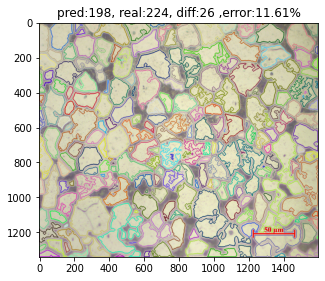

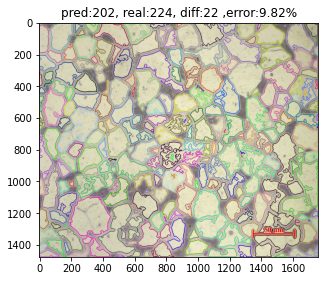

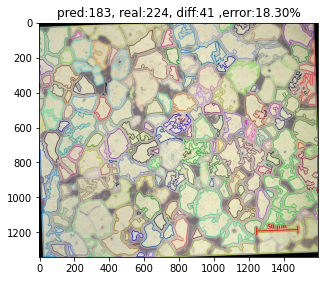

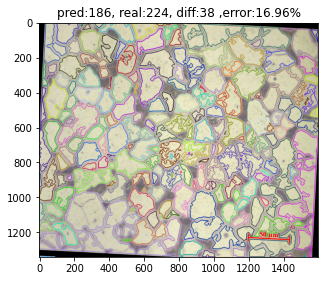

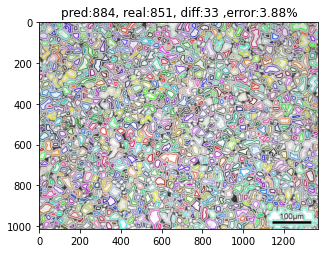

...

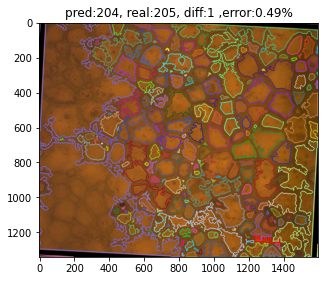

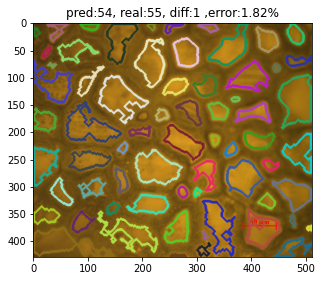

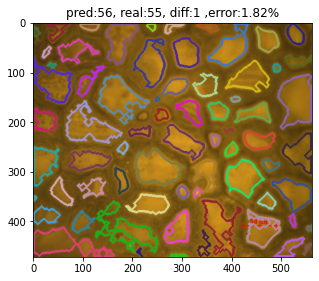

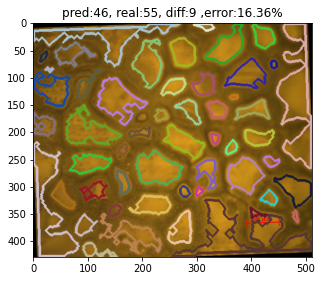

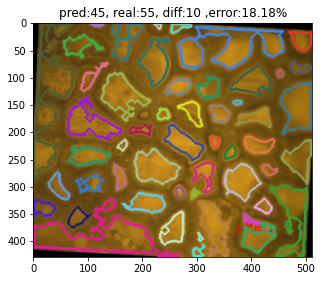

In [32]:
# Avaliando na base de dados
evalGrain(best, fit='avg_p',show=True)

#BestInd: [18, 0, 7, 7, 10, 27, 2, 13] -> [1, 99, 5, 3, 1, 5, 0, 31] ; fitness: 0.09830 ; runtime: 65.04 min

C:\Users\Bruno-NB\Anaconda3\envs\grain-training\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


(0.10406329317053069,)

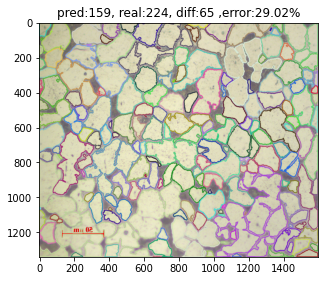

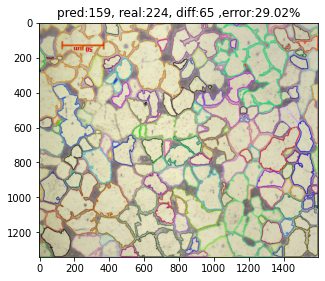

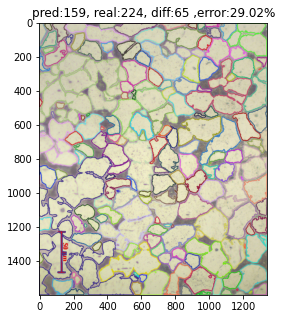

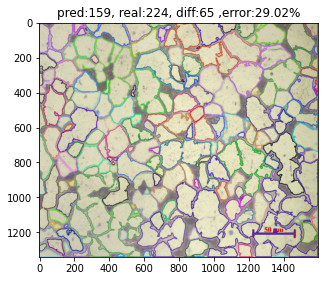

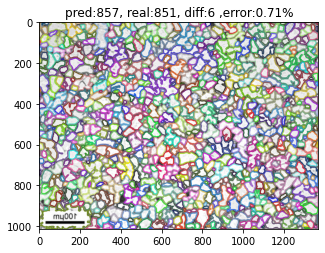

...

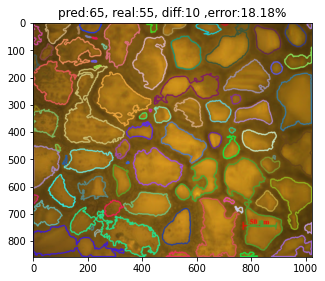

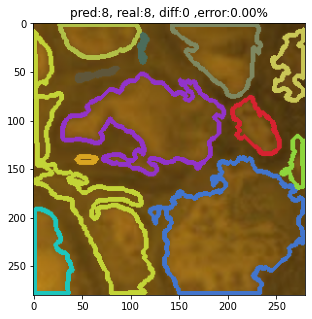

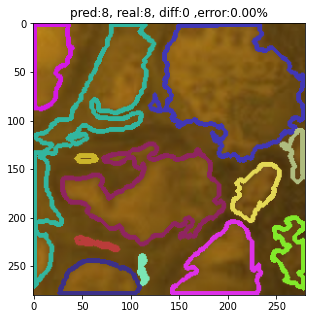

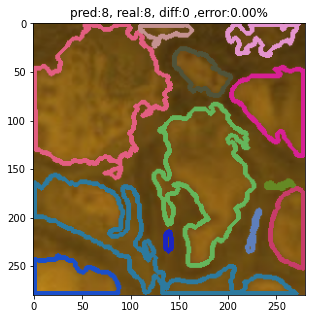

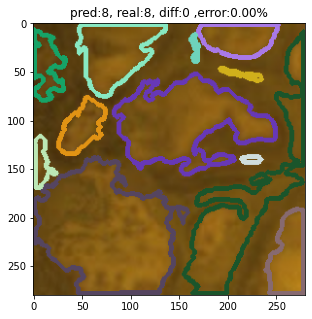

In [13]:
# Avaliando na base de dados
evalGrain(best, fit='avg_p',show=True)

#BestInd: [14, 3, 6, 13, 3, 1, 12, 27] -> [0, 119, 4, 5, 0, 0, 1, 48] ; fitness: 0.10406 ; runtime: 56.52 min

## Discussão sobre os resultados

Como resultado final temos o gráfico da regressão, podemos ver que nosso dataset chega no valor minimo esperado, sem muitas oscilações, também podemos ver que os valores de máximo, média e mínimo caminham juntos até a 20ª iteração, depois disso o valor de máxima acaba oscilando mais que os outros, fazendo o que ele demorasse mais para chegar no valor que desejado.
Como conclusão podemos tirar que a função usada funciona, sendo satisfatório o resultado a otimização, mesmo com o dataset demorando para regredir.
O melhor indivíduo da população na geração final representou uma curva similar a uma reta, com uma inclinação que procura ajustar os dados.
O Mean Squared Error do melhor indivíduo ainda é bastante alto, mas é de se esperar esse resultado ao observar os dados.